**Primary Dataset Download**

In [1]:
import sys
import os
import warnings

sys.stderr = sys.stdout
os.environ["TOKENIZERS_PARALLELISM"] = "false"
warnings.filterwarnings("ignore")

!pip install -q roboflow

from roboflow import Roboflow

rf = Roboflow(api_key="bFCeZjvdm1jyeb9ud2ak")

project = rf.workspace("waleed-azzi-o5bzp").project("wildfire-detection-3vcvr")

dataset = project.version(1).download("yolov5")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.3/85.3 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 35.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 92.9 MB/s eta 0:00:00:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sigstore 3.6.1 requires rich~=13.0, but you have rich 14.0.0 which is incompatible.
datasets 3.5.0 requires fsspec[http]<=2024.12.0,>=2023.1.0, but you have fsspec 2025.3.2 which is incompatible.
nilearn 0.11.1 requires scikit-learn>=1.4.0, but you have scikit-learn 1.2.2 which is incompatible.
google-colab 1.0.0 requires notebook==6.5.5, but you have notebook 6.5.4 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.
google-

E0000 00:00:1746555624.265317      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746555624.334903      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


**Sampling Data**

Saved 7531 samples to /kaggle/working/wildfire-detection--1/train_small


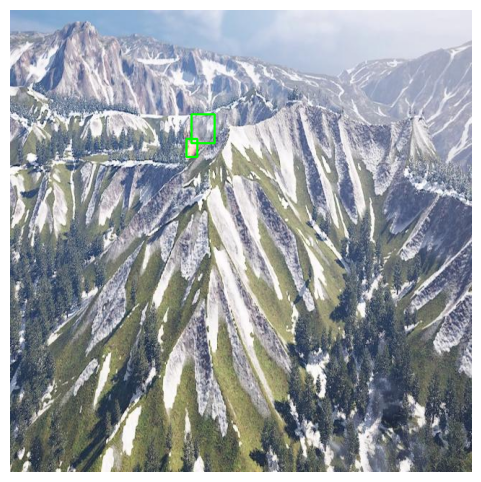

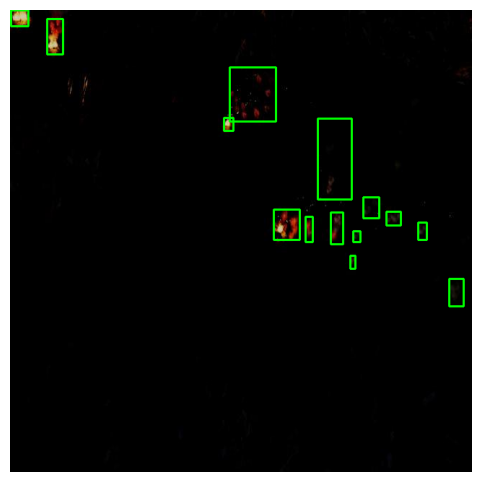

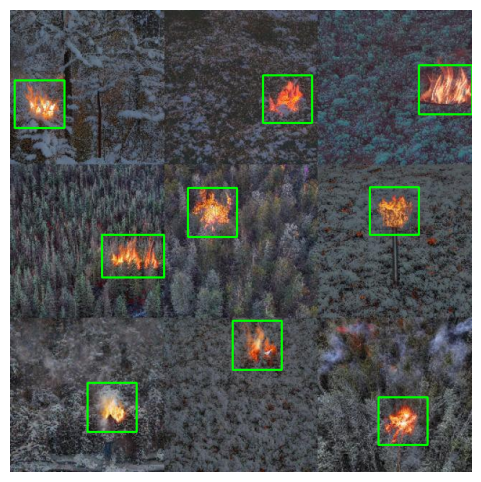

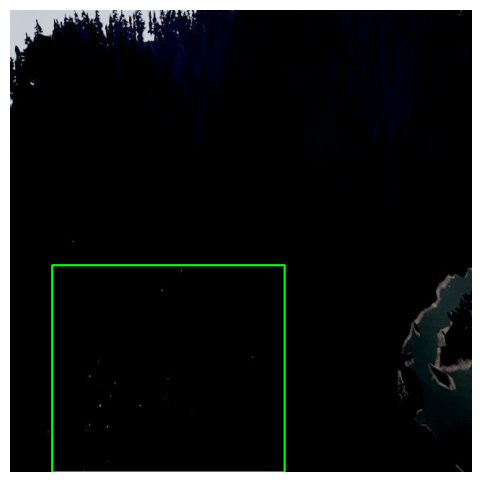

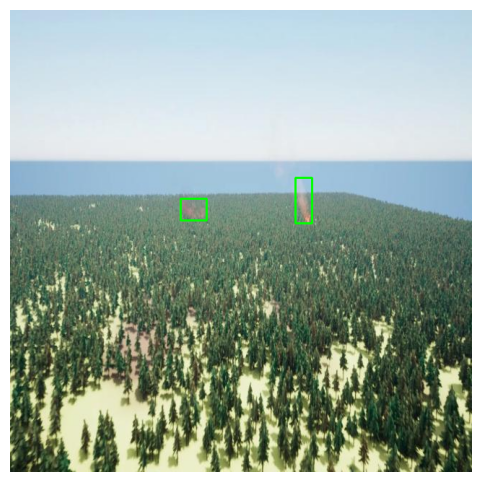

Saved 1215 samples to /kaggle/working/wildfire-detection--1/valid_small


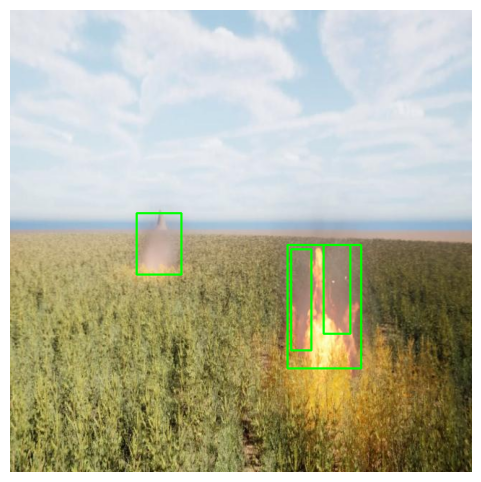

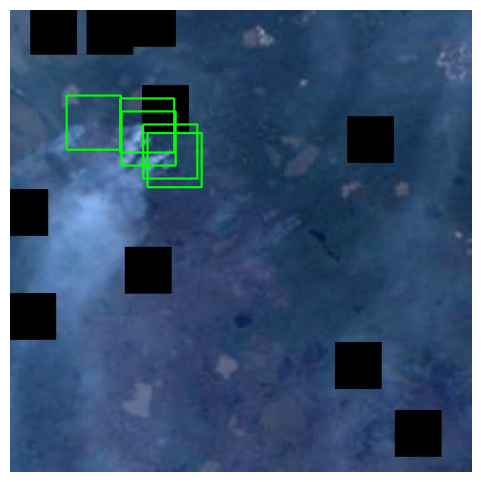

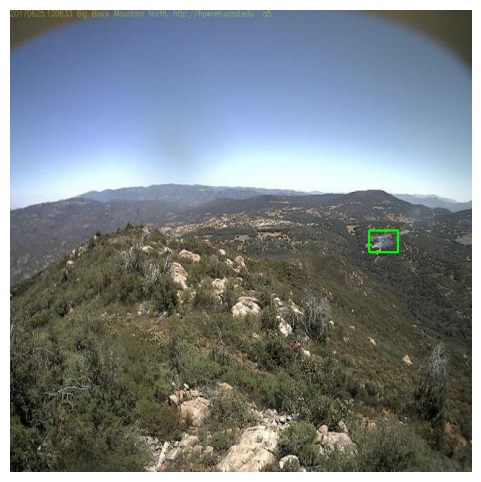

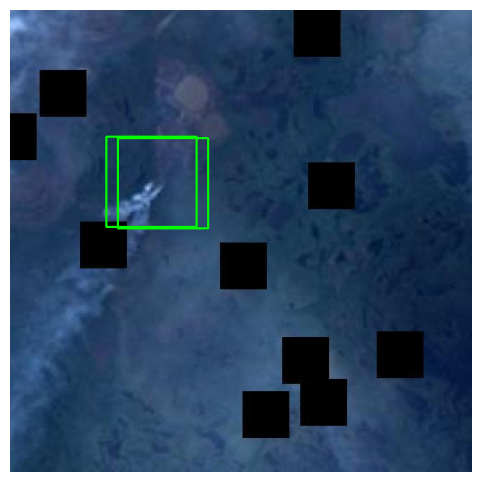

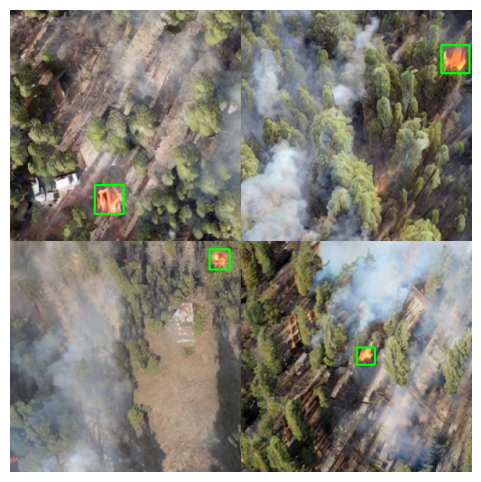

Saved 604 samples to /kaggle/working/wildfire-detection--1/test_small


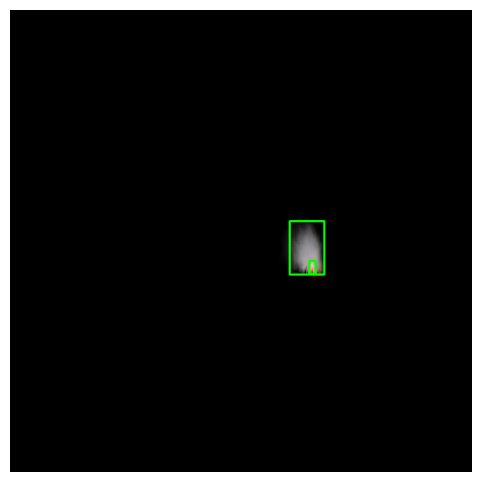

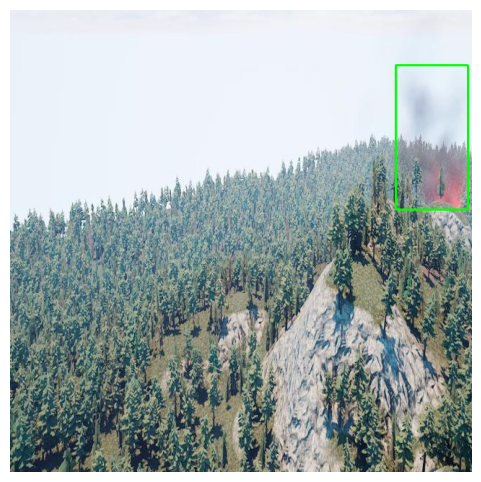

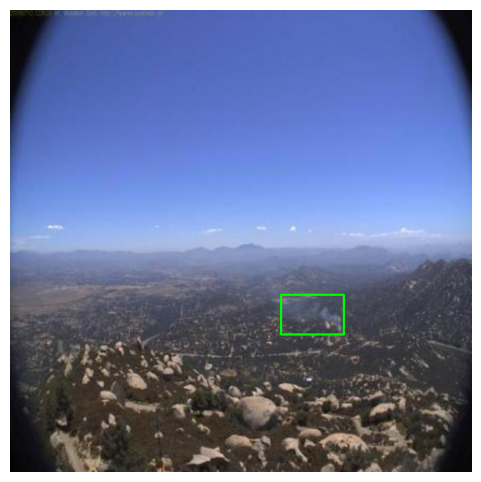

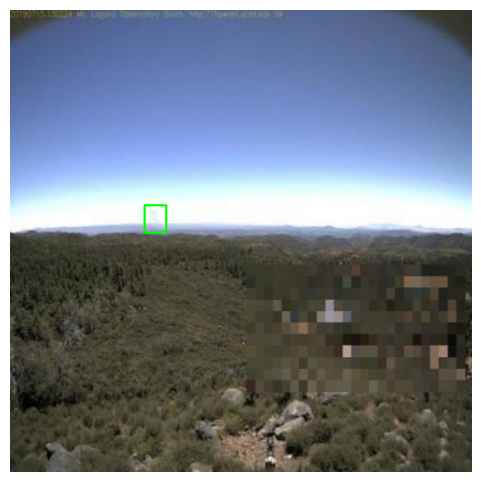

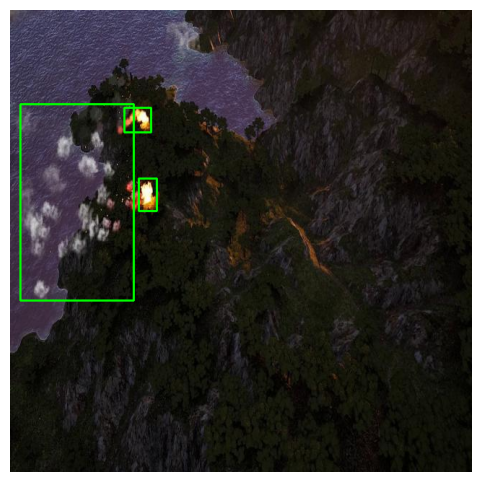

In [ ]:
import random
from glob import glob
import os
import cv2
import matplotlib.pyplot as plt
import shutil

def display_yolo_image(img_path, lbl_path):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Could not read image: {img_path}")
        return
    h, w = img.shape[:2]
    if os.path.exists(lbl_path):
        with open(lbl_path) as f:
            for line in f:
                cls, x_c, y_c, bw, bh = map(float, line.split())
                x1 = int((x_c - bw/2) * w)
                y1 = int((y_c - bh/2) * h)
                x2 = int((x_c + bw/2) * w)
                y2 = int((y_c + bh/2) * h)
                cv2.rectangle(img, (x1,y1), (x2,y2), (0,255,0), 2)
    else:
        cv2.putText(img, "NO FIRE", (10,30),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)
    plt.figure(figsize=(6,6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

def sample_and_display(original_dir, sample_ratio=0.1, display_n=5, save_copy=False):
    img_dir = os.path.join(original_dir, "images")
    lbl_dir = os.path.join(original_dir, "labels")
    out_dir = original_dir + "_small"
    out_img = os.path.join(out_dir, "images")
    out_lbl = os.path.join(out_dir, "labels")

    if os.path.exists(out_dir):
        shutil.rmtree(out_dir)
    os.makedirs(out_img, exist_ok=True)
    os.makedirs(out_lbl, exist_ok=True)

    all_imgs = glob(os.path.join(img_dir, "*.jpg"))
    k = max(1, int(len(all_imgs)*sample_ratio))
    chosen = random.sample(all_imgs, k)

    for img_path in chosen:
        fn = os.path.basename(img_path)
        lbl_path = os.path.join(lbl_dir, fn.replace(".jpg",".txt"))
        shutil.copy(img_path, out_img)
        if os.path.exists(lbl_path):
            shutil.copy(lbl_path, out_lbl)
        else:
            open(os.path.join(out_lbl, fn.replace(".jpg",".txt")), "w").close()

    print(f"Saved {len(chosen)} samples to {out_dir}")
    for img in chosen[:display_n]:
        display_yolo_image(img,
            os.path.join(out_lbl, os.path.basename(img).replace(".jpg",".txt")))

base_path = "/kaggle/working/wildfire-detection--1"
for split in ["train","valid","test"]:
    sample_and_display(os.path.join(base_path, split),
                       sample_ratio=1.0, display_n=5, save_copy=True)


In [4]:
import yaml

yaml_path = "/kaggle/working/wildfire-detection--1/data.yaml"

try:
    with open(yaml_path, 'r') as file:
        data = yaml.safe_load(file)
    
    print("Class mappings:")
    for i, name in enumerate(data['names']):
        print(f"{i}: {name}")
    
    print("\nFull dataset config:")
    print(data)
except FileNotFoundError:
    print(f"Error: {yaml_path} not found!")
except Exception as e:
    print(f"Error reading YAML file: {e}")

Class mappings:
0: fire
1: smoke

Full dataset config:
{'names': ['fire', 'smoke'], 'nc': 2, 'roboflow': {'license': 'CC BY 4.0', 'project': 'wildfire-detection-3vcvr', 'url': 'https://universe.roboflow.com/waleed-azzi-o5bzp/wildfire-detection-3vcvr/dataset/1', 'version': 1, 'workspace': 'waleed-azzi-o5bzp'}, 'test': '../test/images', 'train': 'wildfire-detection--1/train/images', 'val': 'wildfire-detection--1/valid/images'}


In [5]:
!pip install ultralytics pyyaml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 4.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 72.4 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.8.93
  Attempting uninstall: nvidia-curand-cu12
    Found exi

**Dataset Creation** 

In [ ]:
import os
import shutil
import random
import random
import shutil
from glob import glob

def create_subset(original_dir, subset_dir, sample_size=100):
    if os.path.exists(subset_dir):
        shutil.rmtree(subset_dir)

    os.makedirs(os.path.join(subset_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(subset_dir, 'labels'), exist_ok=True)

    img_files = glob(os.path.join(original_dir, 'images', '*.jpg'))
    annotated_imgs = [
        img for img in img_files
        if os.path.exists(img.replace('images', 'labels').replace('.jpg', '.txt'))
    ]

    sampled = random.sample(annotated_imgs, min(sample_size, len(annotated_imgs)))

    for img_path in sampled:
        shutil.copy(img_path, os.path.join(subset_dir, 'images'))
        label_path = img_path.replace('images', 'labels').replace('.jpg', '.txt')
        shutil.copy(label_path, os.path.join(subset_dir, 'labels'))

base_path = "/kaggle/working/wildfire-detection--1"

create_subset(os.path.join(base_path, 'train'), os.path.join(base_path, 'train_small'), 7000)
create_subset(os.path.join(base_path, 'valid'), os.path.join(base_path, 'valid_small'), 1050)
create_subset(os.path.join(base_path, 'test'), os.path.join(base_path, 'test_small'), 700)


base_path = "/kaggle/working/wildfire-detection--1"
nofire_input_path = "/kaggle/input/nofire/nofire"  
nofire_output_path = os.path.join(base_path, "test_small", "images")
label_output_path = os.path.join(base_path, "test_small", "labels")

os.makedirs(nofire_output_path, exist_ok=True)
os.makedirs(label_output_path, exist_ok=True)

all_nofire_images = [f for f in os.listdir(nofire_input_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_nofire_images = random.sample(all_nofire_images, min(400, len(all_nofire_images)))

for image_name in selected_nofire_images:
    src_img = os.path.join(nofire_input_path, image_name)
    dst_img = os.path.join(nofire_output_path, image_name)

    shutil.copy(src_img, dst_img)

    label_name = os.path.splitext(image_name)[0] + ".txt"
    dst_lbl = os.path.join(label_output_path, label_name)
    open(dst_lbl, 'w').close()

print(f"Added {len(selected_nofire_images)} NoFire images with empty labels to test_small.")

Added 400 NoFire images with empty labels to test_small.


In [8]:
import yaml

yaml_path = os.path.join(base_path, 'data.yaml')
with open(yaml_path) as f:
    data = yaml.safe_load(f)

data['train'] = os.path.join(base_path, 'train_small')
data['val'] = os.path.join(base_path, 'valid_small')
data['test'] = os.path.join(base_path, 'test_small')

with open(os.path.join(base_path, 'data_small.yaml'), 'w') as f:
    yaml.dump(data, f)

**Dataset Augmentation**

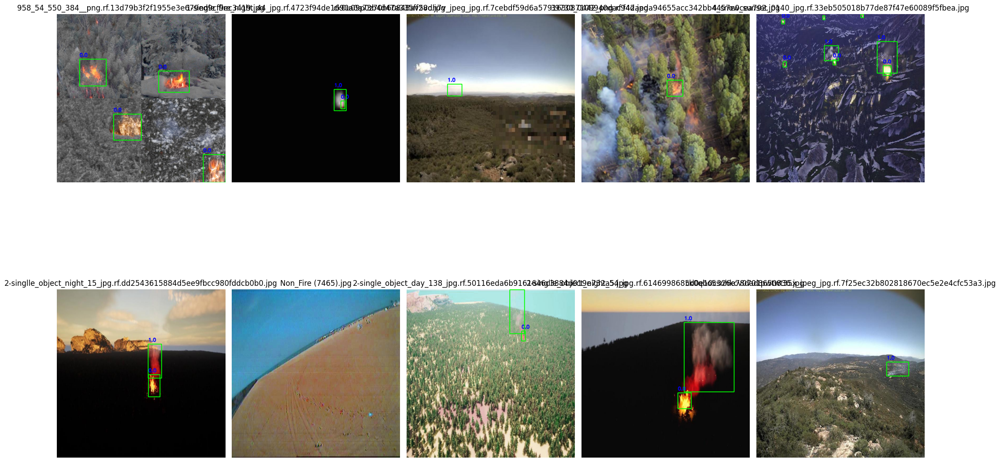

In [26]:
import os
import cv2
import random
import matplotlib.pyplot as plt
from glob import glob
import albumentations as A

def get_transform(resize_dim=None):
    transforms = [
        A.RandomBrightnessContrast(p=0.2),
        A.CLAHE(clip_limit=4.0, p=0.1),
        A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),

        A.Normalize(mean=(0.0, 0.0, 0.0), std=(1.0, 1.0, 1.0), max_pixel_value=255.0)
    ]
    
    if resize_dim is not None:
        transforms.append(A.Resize(height=resize_dim, width=resize_dim))

    return A.Compose(
        transforms,
        bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])
    )

def draw_bboxes(image, bboxes, class_labels):
    """Draw bounding boxes on image"""
    h, w = image.shape[:2]
    for (xc, yc, bw, bh), cls in zip(bboxes, class_labels):
        x1 = int((xc - bw/2) * w)
        y1 = int((yc - bh/2) * h)
        x2 = int((xc + bw/2) * w)
        y2 = int((yc + bh/2) * h)
        
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image, str(cls), (x1, y1 - 10), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)
    return image

def augment_and_save(img_path, out_img_dir, out_lbl_dir, transform, sample_images=None):
    lbl_path = img_path.replace('/images/', '/labels/').replace('.jpg', '.txt')
    
    image = cv2.imread(img_path)
    h, w = image.shape[:2]

    class_labels, bboxes = [], []
    with open(lbl_path) as f:
        for line in f:
            cls, xc, yc, bw, bh = map(float, line.split())
            class_labels.append(int(cls))
            bboxes.append([xc, yc, bw, bh])

    augmented = transform(image=image, bboxes=bboxes, class_labels=class_labels)
    aug_img = augmented['image']
    aug_bboxes = augmented['bboxes']
    aug_classes = augmented['class_labels']

    basename = os.path.basename(img_path)
    aug_path = os.path.join(out_img_dir, basename)
    cv2.imwrite(aug_path, aug_img)

    if sample_images is not None and len(sample_images) < 10:
        img_with_boxes = draw_bboxes(aug_img.copy(), aug_bboxes, aug_classes)
        sample_images.append((img_with_boxes, basename))

    out_lbl = os.path.join(out_lbl_dir, basename.replace('.jpg', '.txt'))
    with open(out_lbl, 'w') as f:
        for cls, (xc, yc, bw, bh) in zip(aug_classes, aug_bboxes):
            f.write(f"{cls} {xc:.6f} {yc:.6f} {bw:.6f} {bh:.6f}\n")

train_img_dir = "/kaggle/working/wildfire-detection--1/train_small/images"
out_img_dir = "/kaggle/working/wildfire-detection--1/train_aug/images"
out_lbl_dir = "/kaggle/working/wildfire-detection--1/train_aug/labels"

os.makedirs(out_img_dir, exist_ok=True)
os.makedirs(out_lbl_dir, exist_ok=True)

sample_images = []

resize_dim = 640
transform = get_transform(resize_dim)

img_paths = glob(os.path.join(train_img_dir, "*.jpg"))
for img_path in img_paths:
    augment_and_save(img_path, out_img_dir, out_lbl_dir, transform, sample_images)

plt.figure(figsize=(20, 15))
for i, (img, title) in enumerate(sample_images[:10], 1):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, 5, i)
    plt.imshow(img_rgb)
    plt.title(title)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [27]:
import yaml

yaml_path = os.path.join(base_path, 'data_small.yaml')
with open(yaml_path) as f:
    data = yaml.safe_load(f)

data['train'] = os.path.join(base_path, 'train_aug')
data['val'] = os.path.join(base_path, 'valid_small')
data['test'] = os.path.join(base_path, 'test_small')

with open(os.path.join(base_path, 'data_aug.yaml'), 'w') as f:
    yaml.dump(data, f)

**YOLO Training**

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8s.pt')  
print("BASE PATH:", base_path)
results = model.train(
    data=os.path.join(base_path, 'data_aug.yaml'),
    epochs=30,
    imgsz=640,
    batch=16,
    name='fire_detection_small',
    exist_ok = True
)

In [10]:
!pip install mean_average_precision

**Secondary Dataset Download**

In [ ]:
!kaggle datasets download -d amerzishminha/forest-fire-smoke-and-non-fire-image-dataset -p /kaggle/working/ --unzip

kaggle.json
Dataset URL: https://www.kaggle.com/datasets/amerzishminha/forest-fire-smoke-and-non-fire-image-dataset
License(s): CC0-1.0


**Creating CLIP Training Data**

In [24]:
import os
import shutil
import random

nofire_input_path = "/kaggle/working/FOREST_FIRE_SMOKE_AND_NON_FIRE_DATASET/train/non fire"
nofire_output_path = "/kaggle/working/wildfire-detection--1/train_small/images"
label_output_path = "/kaggle/working/wildfire-detection--1/train_small/labels"

os.makedirs(nofire_output_path, exist_ok=True)
os.makedirs(label_output_path, exist_ok=True)

all_nofire_images = [f for f in os.listdir(nofire_input_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected = random.sample(all_nofire_images, min(1000, len(all_nofire_images)))

for img_name in selected:
    src = os.path.join(nofire_input_path, img_name)
    dst = os.path.join(nofire_output_path, img_name)
    shutil.copy(src, dst)

    lbl_name = os.path.splitext(img_name)[0] + ".txt"
    open(os.path.join(label_output_path, lbl_name), 'w').close()

print(f"Added {len(selected)} non-fire images to CLIP training set.")


Added 1000 non-fire images to CLIP training set.


In [43]:
from transformers import CLIPProcessor, CLIPModel
import torch

model_name = "openai/clip-vit-base-patch32"
device     = "cuda" if torch.cuda.is_available() else "cpu"

clip_model = CLIPModel.from_pretrained(model_name).to(device)
processor  = CLIPProcessor.from_pretrained(model_name)

alpha            = 0.3   
beta             = 0.7
fusion_threshold = 0.5  

**Logistic Classifier Training**

In [ ]:
import os
import torch
import numpy as np
from PIL import Image
from sklearn.linear_model import LogisticRegression
import pickle
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from tqdm import tqdm 

mean = processor.image_processor.image_mean
std  = processor.image_processor.image_std
clip_preprocess = Compose([
    Resize((224, 224), interpolation=Image.BICUBIC),
    ToTensor(),
    Normalize(mean=mean, std=std)
])

X_embeds, y_labels = [], []

image_files = [f for f in os.listdir(train_img_dir) if f.endswith('.jpg')]

pad_ratio = 0.1  

for img_name in tqdm(image_files, desc="Processing training images"):
    img_path = os.path.join(train_img_dir, img_name)
    lbl_path = os.path.join(train_lbl_dir, img_name.replace('.jpg', '.txt'))

    img = Image.open(img_path).convert('RGB')
    w, h = img.size

    try:
        with open(lbl_path, 'r') as f:
            lines = f.readlines()
    except FileNotFoundError:
        continue

    for line in lines:
        try:
            cls, xc, yc, bw, bh = map(float, line.strip().split())
            
            dw = bw * pad_ratio
            dh = bh * pad_ratio
            x1 = max(0, int((xc - bw/2 - dw) * w))
            y1 = max(0, int((yc - bh/2 - dh) * h))
            x2 = min(w, int((xc + bw/2 + dw) * w))
            y2 = min(h, int((yc + bh/2 + dh) * h))

            crop = img.crop((x1, y1, x2, y2))
            img_tensor = clip_preprocess(crop).unsqueeze(0).to(device)

            with torch.no_grad():
                feat = clip_model.get_image_features(pixel_values=img_tensor)

            X_embeds.append(feat.cpu().numpy().flatten())
            y_labels.append(int(cls))
        except Exception as e:
            print(f"⚠️ Skipping invalid line in {img_name}: {line.strip()}")

X = np.vstack(X_embeds) 
y = np.array(y_labels)

clf = LogisticRegression(max_iter=1000)
clf.fit(X, y)

with open('clip_fire_clf.pkl', 'wb') as f:
    pickle.dump(clf, f)

print(f"Trained CLIP classifier — train accuracy: {clf.score(X, y):.3f}")

**Evaluating Classifier**

In [44]:
import pickle
from sklearn.metrics import accuracy_score
import os
import torch
import numpy as np
from PIL import Image
from sklearn.linear_model import LogisticRegression
import pickle
from torchvision.transforms import Compose, Resize, ToTensor, Normalize
from tqdm import tqdm 


test_img_dir = os.path.join(base_path, 'test_small', 'images')
test_lbl_dir = os.path.join(base_path, 'test_small', 'labels')

weather_mapping = {
    "sunny":   ["a sunny forest with clear visibility",    "bright daylight forest scene"],
    "hazy":    ["a hazy forest with reduced visibility",   "smoky atmospheric forest"],
    "foggy":   ["a foggy forest with thick mist",          "low-visibility foggy woodland"],
    "cloudy":  ["a cloudy forest with overcast sky",       "dimly lit forest under clouds"],
    "duskdawn":["forest at dusk with orange hues",         "sunrise-lit forest landscape"]
}

artifact_prompts = [
    "camera lens flare creating bright spots",
    "overexposed sunlight areas in forest",
    "heavy atmospheric dust particles",
    "morning mist in woodland",
    "shadow patterns resembling smoke",
    "natural fog without combustion",
    "sunlight filtering through trees",
    "cloud formations similar to smoke"
]

base_fire_prompts = [
    "thick black smoke rising above trees",
    "bright orange flames engulfing vegetation",
    "glowing embers spreading in dry grass",
    "dense white smoke plume in forest",
    "red flame fronts moving through woodland",
    "sparking ignition points in dry foliage",
    "charred trees with active ground fire",
    "smoke column developing in forest area"
]

base_nonfire_prompts = [
    "peaceful forest with no signs of combustion",
    "natural fog in mountainous woodland",
    "sunset colors mimicking fire appearance",
    "steam rising from moist forest floor",
    "dust cloud from animal movement in woods",
    "autumn leaves falling in colorful patterns",
    "cloud shadows creating dark forest patches",
    "insect swarms resembling smoke patterns"
]

import torch
import torch.nn.functional as F
from PIL import Image 
import pickle

# Load the classifier from the Kaggle input dataset
model_path = "/kaggle/input/finetuned-clip/clip_fire_clf.pkl"

with open(model_path, 'rb') as f:
    clip_clf = pickle.load(f)


weather_texts  = [p for v in weather_mapping.values() for p in v]
artifact_texts = artifact_prompts
fire_texts     = base_fire_prompts
nonfire_texts  = base_nonfire_prompts

def get_text_embeds(texts):
    inp = processor(text=texts, return_tensors='pt', padding=True).to(device)
    with torch.no_grad():
        emb = clip_model.get_text_features(**inp)
    return F.normalize(emb, dim=-1)

weather_embeds  = get_text_embeds(weather_texts)   
artifact_embeds = get_text_embeds(artifact_texts)  
fire_embeds     = get_text_embeds(fire_texts)      
nonfire_embeds  = get_text_embeds(nonfire_texts)

def avg_sim(img_feat, embeds):
    sims = (img_feat @ embeds.T).squeeze(0)
    return sims.mean().item()

def classify_with_context(crop: Image.Image,
                          head_w=0.5, prompt_w=0.5,
                          context_w=0.1, threshold=0.5):
    img_t = clip_preprocess(crop).unsqueeze(0).to(device)
    with torch.no_grad():
        img_feat = clip_model.get_image_features(pixel_values=img_t)
    img_feat = F.normalize(img_feat, dim=-1)

    head_feat = img_feat.cpu().numpy().reshape(1,-1)
    probs = clip_clf.predict_proba(head_feat)[0]
    head_prob = probs[ clf.classes_.tolist().index(0) ] 

    fire_score    = avg_sim(img_feat, fire_embeds)
    nonfire_score = avg_sim(img_feat, nonfire_embeds)
    prompt_prob   = fire_score / (fire_score + nonfire_score + 1e-6)

    weather_score  = avg_sim(img_feat, weather_embeds)
    artifact_score = avg_sim(img_feat, artifact_embeds)
    context_score  = context_w * (weather_score - artifact_score)

    final_score = head_w * head_prob + prompt_w * prompt_prob + context_score
    return ("FIRE" if final_score >= threshold else "NON-FIRE"), final_score

image_files = [
    f for f in os.listdir(test_img_dir)
    if f.lower().endswith(('.jpg','.jpeg','.png'))
]

y_true, y_pred = [], []

for img_name in tqdm(image_files, desc="Evaluating test images"):
    img_path = os.path.join(test_img_dir, img_name)
    lbl_path = os.path.join(test_lbl_dir, img_name.rsplit('.',1)[0] + '.txt')

    gt = 1 if os.path.exists(lbl_path) and len(open(lbl_path).read().splitlines())>0 else 0
    y_true.append(gt)

    img = Image.open(img_path).convert('RGB')
    pred_label, _ = classify_with_context(img)
    y_pred.append(1 if pred_label=="FIRE" else 0)

acc = accuracy_score(y_true, y_pred)
print(f"Processed {len(image_files)} images → Test Accuracy: {acc*100:.2f}%")


Evaluating test images: 100%|██████████| 1004/1004 [00:22<00:00, 45.31it/s]
Processed 1004 images → Test Accuracy: 60.16%


**Integrating CLIP and YOLO**


image 1/1 /kaggle/working/wildfire-detection--1/test_small/images/CBERS_4A_WFI_20200505_220_132_L2_2603_4087_5_png_jpg.rf.bd3db3a1d75346191ccaa092f8d032c8.jpg: 640x640 36 fires, 16.2ms
Speed: 1.6ms preprocess, 16.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


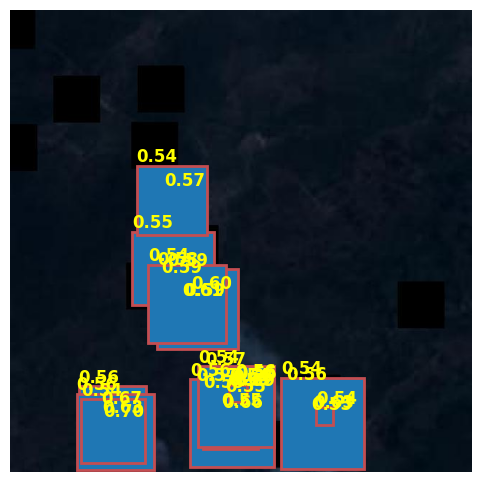


image 1/1 /kaggle/working/wildfire-detection--1/test_small/images/nofire_0360.jpg: 640x640 1 smoke, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


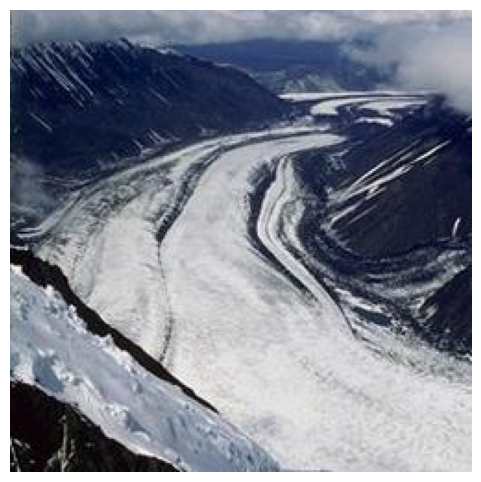


image 1/1 /kaggle/working/wildfire-detection--1/test_small/images/nofire_0061.jpg: 640x640 (no detections), 10.6ms
Speed: 2.1ms preprocess, 10.6ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


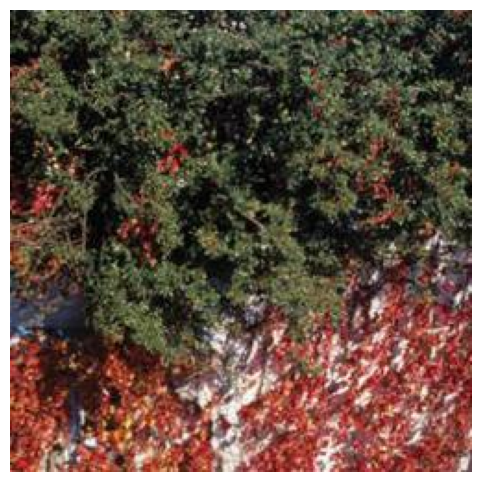


image 1/1 /kaggle/working/wildfire-detection--1/test_small/images/49_233_209_184__png.rf.ccc0e883dc46fc3770ecf9cc8cdf2285.jpg: 640x640 4 fires, 10.6ms
Speed: 1.6ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


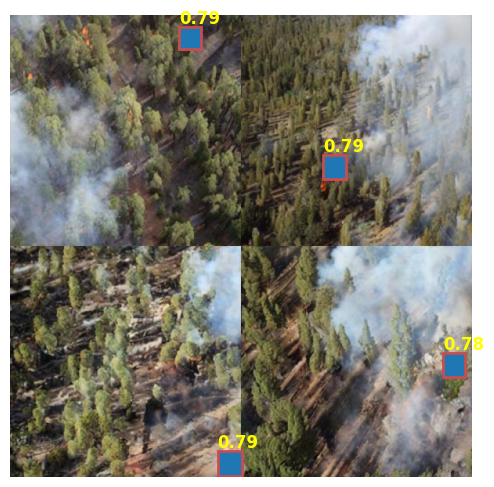


image 1/1 /kaggle/working/wildfire-detection--1/test_small/images/nofire_0317.jpg: 640x640 (no detections), 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


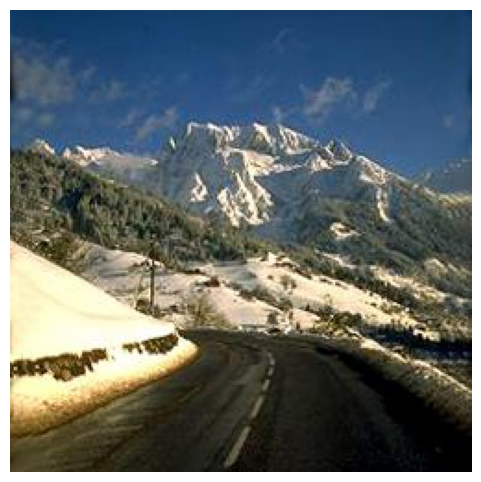

In [ ]:
import os, glob, random
import cv2
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO
from PIL import Image

yolo_model = YOLO('/kaggle/input/yolov8s/best.pt')
samples = glob.glob(os.path.join(base_path, 'test_small', 'images', '*.jpg'))

for img_path in random.sample(samples, min(5, len(samples))):
    orig_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(orig_bgr, cv2.COLOR_BGR2RGB)

    result = yolo_model.predict(img_path, conf=0.05, imgsz=640)[0]
    boxes = result.boxes.xyxy.cpu().numpy()
    yolo_cs = result.boxes.conf.cpu().numpy()
    labels = result.boxes.cls.cpu().numpy().astype(int)

    kept = []
    for (x1, y1, x2, y2), yconf, cls in zip(boxes, yolo_cs, labels):
        if cls != 0:
            continue
        crop = Image.fromarray(img_rgb[int(y1):int(y2), int(x1):int(x2)])
        clip_label, clip_fire = classify_with_context(crop)  

        fused = alpha * yconf + beta * clip_fire
        if fused > fusion_threshold:
            kept.append(((x1, y1, x2, y2), fused))

    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    ax.imshow(img_rgb)
    for (x1, y1, x2, y2), fs in kept:
        rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1,
                              edgecolor='r', linewidth=2)
        ax.add_patch(rect)
        ax.text(x1, y1 - 5, f"{fs:.2f}",
                color='yellow', fontsize=12, weight='bold')
    ax.axis('off')
    plt.show()


**Calculating Evaluation Metrics**

Scanning for test images...


Finding images:   0%|          | 0/1004 [00:00<?, ?it/s]


Initializing models...


Loading YOLO:   0%|          | 0/1 [00:00<?, ?it/s]


Starting evaluation pipeline...


Evaluating images:   0%|          | 0/1004 [00:00<?, ?img/s]

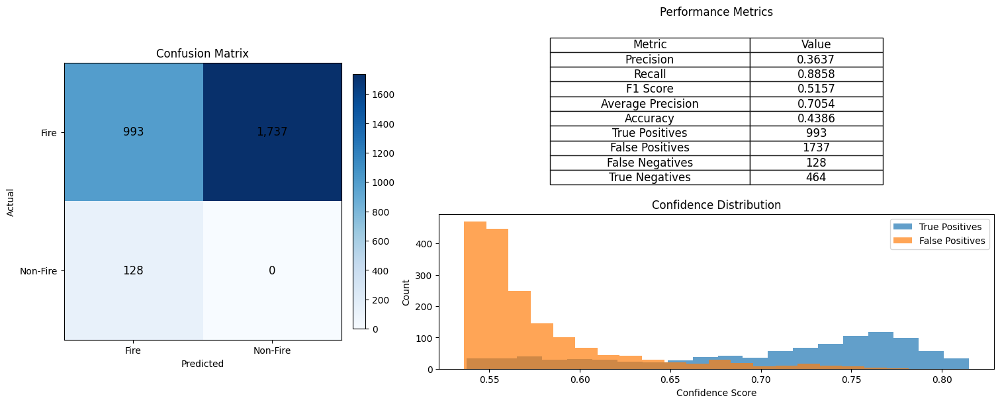


Evaluation Complete!
Processed 1004 images
Final F1 Score: 0.5157


In [46]:
import os
import glob
from collections import defaultdict
from tqdm.auto import tqdm  
import matplotlib.pyplot as plt
import numpy as np
import cv2
from PIL import Image
from ultralytics import YOLO
import torch
import torch.nn.functional as F

CONFIG = {
    "base_path": "/kaggle/working/wildfire-detection--1",
    "yolo_model_path": "/kaggle/input/yolov8s/best.pt",
    "iou_threshold": 0.5,
    "fusion_weights": (alpha, beta),  
    "fusion_threshold": fusion_threshold,
    "image_size": 640
}

def read_yolo_labels(label_file):
    """
    Reads YOLO-format labels from a .txt file.
    Returns a list of tuples: (class_id, x_center, y_center, width, height)
    """
    with open(label_file, 'r') as f:
        lines = f.readlines()
    return [tuple(map(float, line.strip().split())) for line in lines]

def calculate_iou(box1, box2):
    """
    Calculates IoU between two boxes: (x1, y1, x2, y2)
    """
    x1, y1, x2, y2 = box1
    x1g, y1g, x2g, y2g = box2

    xi1 = max(x1, x1g)
    yi1 = max(y1, y1g)
    xi2 = min(x2, x2g)
    yi2 = min(y2, y2g)
    inter_width = max(0, xi2 - xi1)
    inter_height = max(0, yi2 - yi1)
    inter_area = inter_width * inter_height

    box1_area = (x2 - x1) * (y2 - y1)
    box2_area = (x2g - x1g) * (y2g - y1g)
    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area if union_area > 0 else 0.0


def yolo_to_pixels(box, img_w, img_h):
    """
    Converts YOLO-format box (x_center, y_center, width, height)
    to pixel coordinates (x1, y1, x2, y2)
    """
    x_c, y_c, w, h = box
    x1 = (x_c - w / 2) * img_w
    y1 = (y_c - h / 2) * img_h
    x2 = (x_c + w / 2) * img_w
    y2 = (y_c + h / 2) * img_h
    return (x1, y1, x2, y2)


def setup_environment():
    """Initialize paths and verify environment"""
    paths = {
        "gt_labels": os.path.join(CONFIG["base_path"], 'test_small', 'labels'),
        "images": os.path.join(CONFIG["base_path"], 'test_small', 'images'),
    }
    
    for name, path in paths.items():
        if not os.path.exists(path):
            raise FileNotFoundError(f"{name} directory not found: {path}")
    
    print("Scanning for test images...")
    samples = []
    with tqdm(glob.glob(os.path.join(paths["images"], '*.jpg')), desc="Finding images") as pbar:
        for img_path in pbar:
            samples.append(img_path)
            pbar.set_postfix(found=len(samples))
    
    if not samples:
        raise FileNotFoundError("No test images found")
    
    return paths, samples

def initialize_models():
    """Load YOLO and CLIP models with progress indication"""
    print("\nInitializing models...")
    
    with tqdm(total=1, desc="Loading YOLO") as pbar:
        yolo_model = YOLO(CONFIG["yolo_model_path"])
        pbar.update(1)
    
    return yolo_model

def calculate_metrics(stats):
    """Compute precision, recall, F1 score, average precision, and accuracy"""
    tp = len(stats['true_positives'])
    fp = len(stats['false_positives'])
    fn = len(stats['false_negatives'])
    tn = len(stats['true_negatives'])

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    f1_score = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0.0
    average_precision = np.mean(stats['true_positives']) if stats['true_positives'] else 0.0
    accuracy = (tp + tn) / (tp + tn + fp + fn) if (tp + tn + fp + fn) > 0 else 0.0

    return {
        "precision": precision,
        "recall": recall,
        "f1_score": f1_score,
        "average_precision": average_precision,
        "accuracy": accuracy,
        "true_positives": tp,
        "false_positives": fp,
        "false_negatives": fn,
        "true_negatives": tn
    }

def evaluate_pipeline(yolo_model, clip_func, paths, samples):
    """Main evaluation pipeline with comprehensive progress tracking"""
    stats = defaultdict(list)
    alpha, beta = CONFIG["fusion_weights"]

    for img_path in tqdm(samples, desc="Evaluating images", unit="img"):
        base = os.path.splitext(os.path.basename(img_path))[0]
        gt_file = os.path.join(paths["gt_labels"], f"{base}.txt")
        gt_boxes = []
        if os.path.exists(gt_file):
            for cls, *box in read_yolo_labels(gt_file):
                if cls == 0:
                    gt_boxes.append(yolo_to_pixels(box, CONFIG["image_size"], CONFIG["image_size"]))

        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        res = yolo_model.predict(img_path, conf=0.05, imgsz=CONFIG["image_size"], verbose=False)[0]
        detections = []
        for (x1,y1,x2,y2), conf, cls in zip(res.boxes.xyxy.cpu(), res.boxes.conf.cpu(), res.boxes.cls.cpu()):
            if int(cls) != 0: continue
            crop = Image.fromarray(img[int(y1):int(y2), int(x1):int(x2)])
            _, clip_score = clip_func(crop)
            fused = alpha*conf.item() + beta*clip_score
            if fused > CONFIG["fusion_threshold"]:
                detections.append(((x1.item(),y1.item(),x2.item(),y2.item()), fused))

        matched = set()
        for box, score in detections:
            best_iou, best_idx = 0, -1
            for idx, gt in enumerate(gt_boxes):
                if idx in matched: continue
                iou = calculate_iou(box, gt)
                if iou > best_iou:
                    best_iou, best_idx = iou, idx
            if best_iou >= CONFIG["iou_threshold"]:
                stats['true_positives'].append(score)
                matched.add(best_idx)
            else:
                stats['false_positives'].append(score)

        stats['false_negatives'].extend([1] * (len(gt_boxes) - len(matched)))

        if len(gt_boxes)==0 and len(detections)==0:
            stats['true_negatives'].append(1)

    return stats


def visualize_results(stats):
    """Enhanced visualization with more metrics"""
    metrics = calculate_metrics(stats)
    
    fig = plt.figure(figsize=(15, 6), constrained_layout=True)
    gs = fig.add_gridspec(2, 3)
    
    ax1 = fig.add_subplot(gs[:, 0])
    conf_matrix = np.array([
        [metrics['true_positives'], metrics['false_positives']],
        [metrics['false_negatives'], 0]  
    ])
    im = ax1.imshow(conf_matrix, cmap='Blues')
    for i in range(2):
        for j in range(2):
            ax1.text(j, i, f"{conf_matrix[i,j]:,}", ha='center', va='center', fontsize=12)
    ax1.set_xticks([0, 1])
    ax1.set_yticks([0, 1])
    ax1.set_xticklabels(['Fire', 'Non-Fire'])
    ax1.set_yticklabels(['Fire', 'Non-Fire'])
    ax1.set_xlabel('Predicted')
    ax1.set_ylabel('Actual')
    ax1.set_title('Confusion Matrix')
    plt.colorbar(im, ax=ax1, fraction=0.046, pad=0.04)
    
    ax2 = fig.add_subplot(gs[0, 1:])
    ax2.axis('off')
    metric_data = [
        ["Precision", f"{metrics['precision']:.4f}"],
        ["Recall", f"{metrics['recall']:.4f}"],
        ["F1 Score", f"{metrics['f1_score']:.4f}"],
        ["Average Precision", f"{metrics['average_precision']:.4f}"],
        ["Accuracy", f"{metrics['accuracy']:.4f}"],
        ["True Positives", f"{metrics['true_positives']}"],
        ["False Positives", f"{metrics['false_positives']}"],
        ["False Negatives", f"{metrics['false_negatives']}"],
        ["True Negatives", f"{metrics['true_negatives']}"]
]
    table = ax2.table(
        cellText=metric_data,
        colLabels=["Metric", "Value"],
        loc='center',
        cellLoc='center',
        colWidths=[0.3, 0.2]
    )
    table.auto_set_font_size(False)
    table.set_fontsize(12)
    table.scale(1.2, 1.2)
    ax2.set_title('Performance Metrics', pad=20)
    
    ax3 = fig.add_subplot(gs[1, 1:])
    if stats['true_positives']:
        ax3.hist(stats['true_positives'], bins=20, alpha=0.7, label='True Positives')
    if stats['false_positives']:
        ax3.hist(stats['false_positives'], bins=20, alpha=0.7, label='False Positives')
    ax3.set_xlabel('Confidence Score')
    ax3.set_ylabel('Count')
    ax3.set_title('Confidence Distribution')
    ax3.legend()
    
    plt.show()
    return metrics

if __name__ == "__main__":
    try:
        paths, samples = setup_environment()
        yolo_model = initialize_models()
        
        print("\nStarting evaluation pipeline...")
        stats = evaluate_pipeline(yolo_model, classify_with_context, paths, samples)
        
        metrics = visualize_results(stats)
        
        print("\nEvaluation Complete!")
        print(f"Processed {len(samples)} images")
        print(f"Final F1 Score: {metrics['f1_score']:.4f}")
        
    except Exception as e:
        print(f"\nError in evaluation pipeline: {str(e)}")


**Evaluating YOLO**

In [42]:
from ultralytics import YOLO
import os

model = YOLO('/kaggle/input/yolov8s/best.pt')

metrics = model.val(
    data    = os.path.join(base_path, 'data_small.yaml'),
    imgsz   = 640,
    batch   = 16,
    conf    = 0.05,
    augment = True       
)

print(f"[TTA]  mAP50:    {metrics.box.map50:.4f}")
print(f"[TTA]  mAP50-95: {metrics.box.map:.4f}")

Ultralytics 8.3.127 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs
100%|██████████| 755k/755k [00:00<00:00, 17.9MB/s]
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 32.6±14.9 MB/s, size: 51.3 KB)
val: Scanning /kaggle/working/wildfire-detection--1/valid_small/labels... 1050 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1050/1050 [00:01<00:00, 770.53it/s]
val: New cache created: /kaggle/working/wildfire-detection--1/valid_small/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 66/66 [00:28<00:00,  2.34it/s]
                   all       1050       3394      0.819      0.736      0.841      0.526
                  fire        831       2153      0.831       0.66      0.795      0.474
                 smoke        663       1241      0.806      0.813      0.886      0.578
Speed: 0.4ms preprocess, 20.8ms inference, 0.

**Visualizing Results**

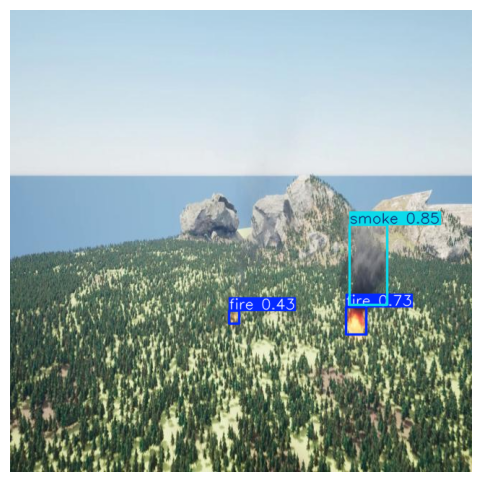

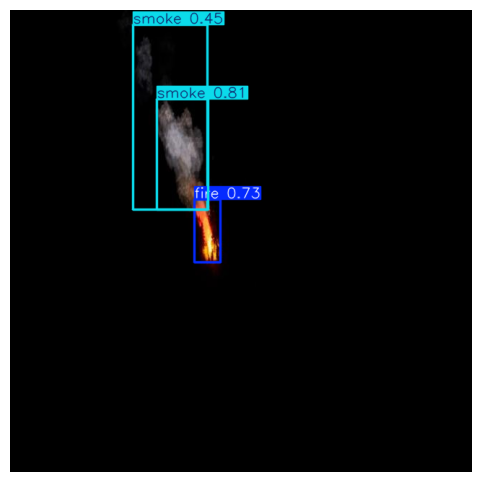

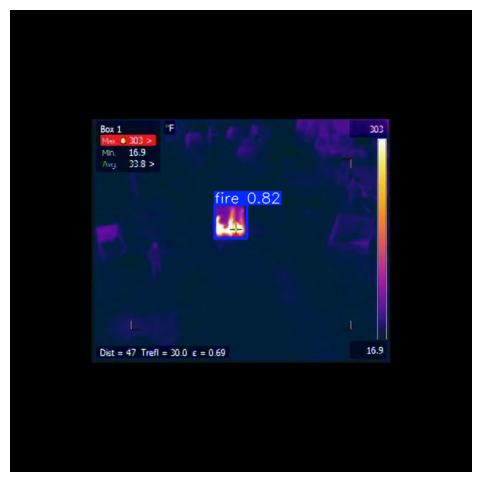

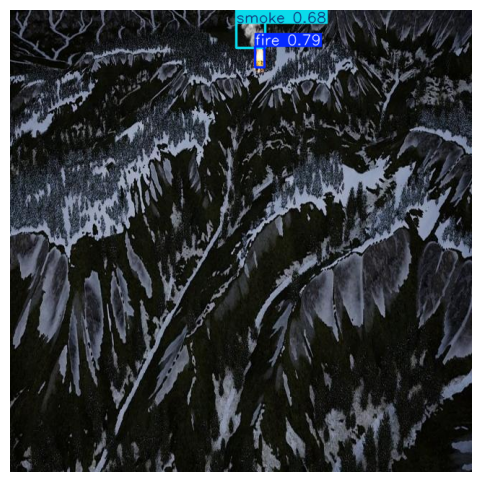

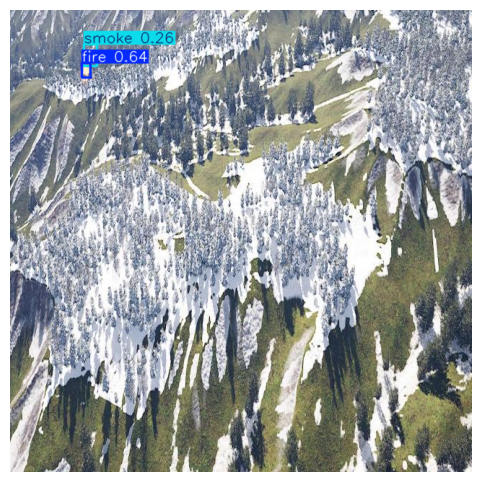

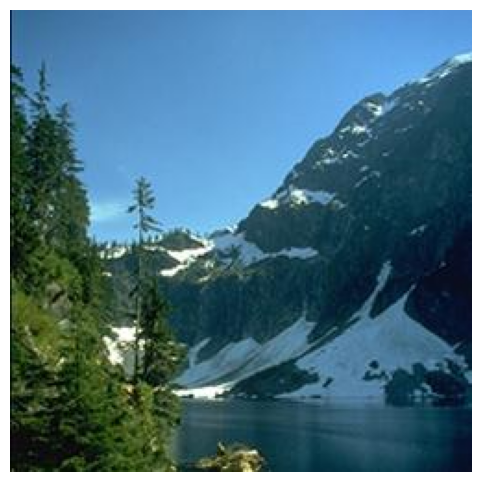

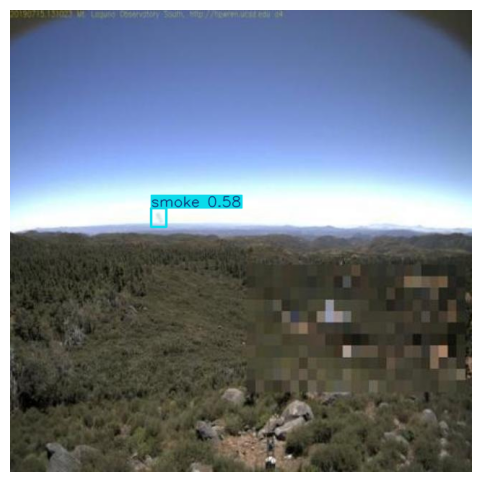

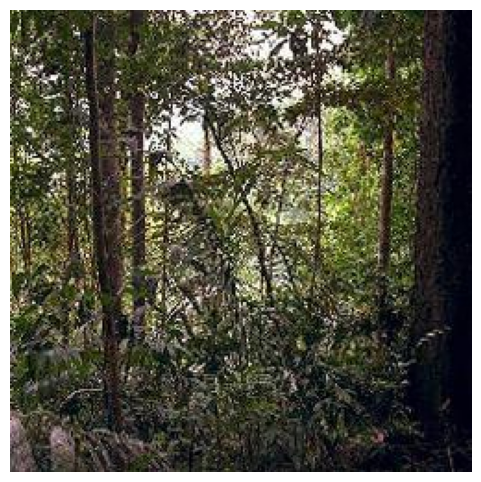

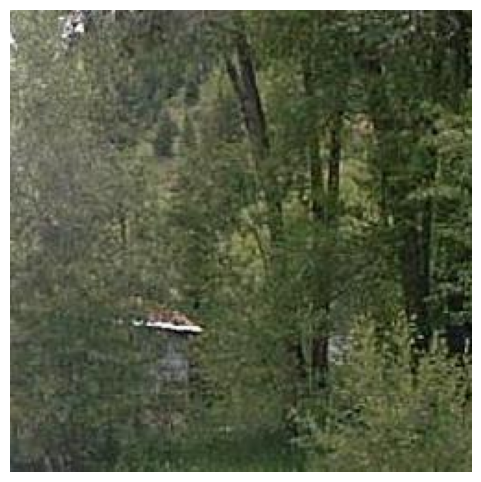

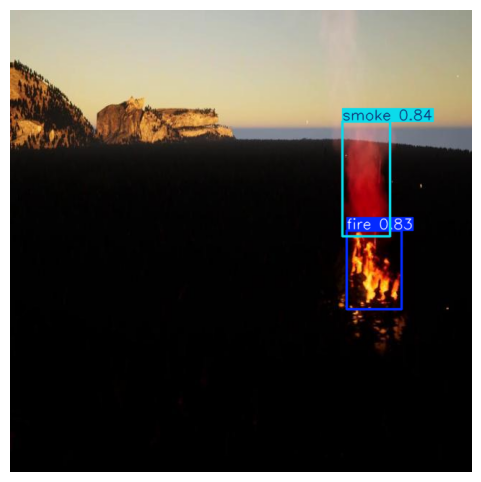

In [84]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

samples = glob.glob(os.path.join(base_path,'test_small','images','*.jpg'))
for img in random.sample(samples, min(10,len(samples))):
    result = yolo_model.predict(img, conf=0.2)[0]
    vis = result.plot()
    plt.figure(figsize=(6,6))
    plt.imshow(vis[...,::-1])
    plt.axis('off')
    plt.show()
